In [3]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from scipy.stats import zscore
from scipy.interpolate import interp1d
from scipy.io import loadmat

import seaborn as sns
sns.set_context('notebook', font_scale=1.5)

from core import *

In [16]:

data_dir = r"d:\Sid\data\Use_dependent_sleep\UDS_R01\UDS_R01_20250212"
session_name = "pre_homecage_g0"
probes = [0, 1, 2]

# defining the region dictionary. Keys are probe numbers, values are dictionaries which are further mapping shanks to regions
region_dict = {0: {0: 'CA1', 1: 'RSP', 2: 'CA3', 3: 'CA1', 4: 'RSP', 5: 'CA3', 6: 'CA1', 7: 'RSP'}, 1: {0: 'CA2', 1: 'CA1', 2: 'CA1', 3: 'AuCtx', 4: 'PCtx'}, 2: {0: 'Th', 1: 'Th', 2: 'V1', 3: 'Th', 4: 'idk', 5: 'V1', 6: 'V1', 7: 'V1'}}

In [ ]:
# ----------------------------- Config ---------------------------------
WINDOW_SIZE = 0.03          # s
STEP_SIZE   = 0.015         # s
SIGMA       = 5          # smoothing sigma (0 -> no smoothing)
USE_UNITS   = "good"       # {'all', 'good', 'mua'}
NORMALIZE   = True         # z-score each unit's rates

# Filtering thresholds
MIN_TOTAL_SPIKES   = 100
MIN_MEAN_RATE_HZ   = 0.01
MIN_PRESENCE_RATIO = 0.25
N_TIME_BINS        = 100    # coarse bins for presence ratio


spike_rate_matrices = {}
cell_types = {}
regions = {}
for probe in probes:

    # Get the raw spike counts and the zscored and smoothed spike rates
    ks_dir = os.path.join(data_dir, 'preprocessing_output', f'supercat_{session_name}', f'{session_name}_imec{probe}', f'imec{probe}_ks4')
    raw_rates, time_bins, units = compute_spike_rates(str(ks_dir), WINDOW_SIZE, STEP_SIZE, USE_UNITS, 0.0, False)
    spike_rate_matrix, _, _ = compute_spike_rates(str(ks_dir), WINDOW_SIZE, STEP_SIZE, USE_UNITS, SIGMA, NORMALIZE)
    est_counts_per_bin = raw_rates * WINDOW_SIZE


    # computing the filtering metrics
    total_spikes   = est_counts_per_bin.sum(axis=1)         
    mean_rate_hz   = raw_rates.mean(axis=1)
    presence_ratio = get_presence_ratio(est_counts_per_bin, time_bins, N_TIME_BINS)

    mask = (
        (total_spikes >= MIN_TOTAL_SPIKES) &
        (mean_rate_hz >= MIN_MEAN_RATE_HZ) &
        (presence_ratio >= MIN_PRESENCE_RATIO)
    )


    # Apply mask to spike rate matrix and unit list
    spike_rate_matrix = spike_rate_matrix[mask, :]
    units = [u for u, keep in zip(units, mask) if keep]
    print(f"Probe {probe}: Keeping {mask.sum()} / {mask.sum() + (~mask).sum()} units after filtering.\nspike_rate_matrix shape: {spike_rate_matrix.shape}\n")

    # remove units based on presence ratio
    spike_rate_matrices[probe] = (spike_rate_matrix, time_bins, units)


    # Load the cell metrics
    cell_metrics_file = os.path.join(data_dir, 'preprocessing_output', f'supercat_{session_name}', f'{session_name}_imec{probe}', f'{session_name}_tcat.imec{probe}.ap.cell_metrics.cellinfo.mat')
    cell_type = loadmat(cell_metrics_file)['cell_metrics']['putativeCellType'][0,0].flatten()
    shank_ids = loadmat(cell_metrics_file)['cell_metrics']['shankID'][0,0].flatten()


    # keeping only the string labels
    cell_type = np.array([ct[0] if isinstance(ct, np.ndarray) else ct for ct in cell_type])

    # removing mask applied units from cell type
    cell_types[probe] = cell_type[mask]
    regions[probe] = np.array([region_dict[probe][shank_id-1] for shank_id in shank_ids[mask]])  # shank IDs are 1-based

Probe 0: Keeping 105 / 126 units after filtering.
spike_rate_matrix shape: (105, 246291)

Probe 1: Keeping 307 / 330 units after filtering.
spike_rate_matrix shape: (307, 246291)

Probe 2: Keeping 103 / 109 units after filtering.
spike_rate_matrix shape: (103, 246291)



Plotting Probe 0, Cell Type Pyramidal
Plotting Probe 0, Cell Type Interneuron
Plotting Probe 1, Cell Type Pyramidal
Plotting Probe 1, Cell Type Interneuron
Plotting Probe 2, Cell Type Pyramidal
Plotting Probe 2, Cell Type Interneuron


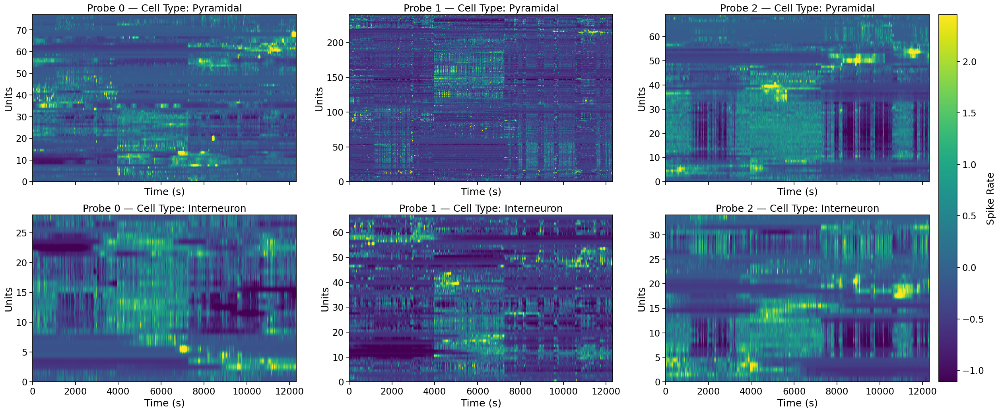

In [5]:
# --- Choose cell-type names to aggregate CellMetric labels by ---
cell_type_groups = {
    'Pyramidal':   ['Pyramidal Cell'],
    'Interneuron': ['Narrow Interneuron', 'Wide Interneuron'],
}


n_rows = max(1, len(cell_type_groups))
n_cols = max(1, len(probes))
fig, axs = plt.subplots(
    n_rows, n_cols,
    figsize=(30, 6 * n_rows),
    sharex=True,
    squeeze=False
)

first_im = None  # will store the first image for the colorbar

for i, probe in enumerate(probes):
    # unpack once per probe
    spike_rate_matrix, time_bins, units = spike_rate_matrices[probe]
    cell_types_probe = cell_types[probe]

    # (optional) consistent vmin/vmax per probe (or compute global if you prefer)
    vmin = np.percentile(spike_rate_matrix, 2.5)
    vmax = np.percentile(spike_rate_matrix, 97.5)

    for j, cell_type in enumerate(cell_type_groups):
        print(f"Plotting Probe {probe}, Cell Type {cell_type}")

        # getting the relevant cell type labels
        cell_type_labels = cell_type_groups[cell_type]
        cell_type_indices = [k for k, ct in enumerate(cell_types_probe) if ct in cell_type_labels]


        # select the appropriate axis
        ax = axs[j, i]


        if len(cell_type_indices) == 0:
            ax.set_visible(False)  # no data for this panel
            continue

        # sorting the units by correlation
        M = sort_units(spike_rate_matrix[np.array(cell_type_indices), :], mode='corr')

        # plotting firing rate heatmap for this cell type
        im = ax.imshow(
            M,
            aspect='auto',
            cmap='viridis',
            extent=[time_bins[0], time_bins[-1], 0, len(cell_type_indices)],
            vmin=vmin,
            vmax=vmax,
            origin='lower'  # so unit 0 is at the bottom
        )

        if first_im is None:
            first_im = im

        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Units')
        ax.set_title(f'Probe {probe} — Cell Type: {cell_type}')

# colorbar: attach to all visible axes
if first_im is not None:
    visible_axes = [ax for ax in axs.ravel() if ax.get_visible()]
    cbar = fig.colorbar(first_im, ax=visible_axes, orientation='vertical', fraction=0.02, pad=0.01)
    cbar.set_label('Spike Rate')

#plt.tight_layout()
plt.show()

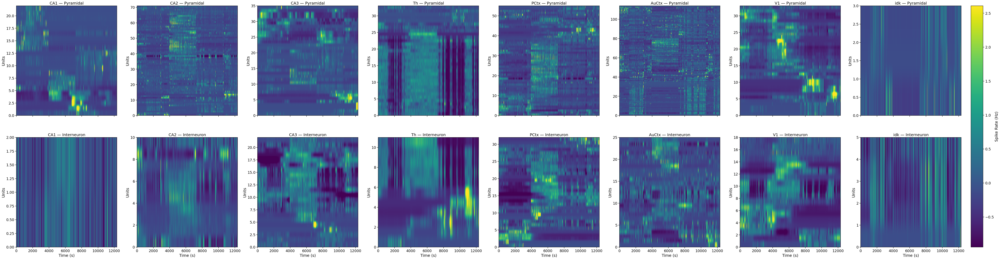

In [7]:
# ---- Choose regions to display as columns ----
regions_of_interest = ['CA1', 'CA2', 'CA3', 'Th', 'PCtx', 'AuCtx', 'V1', 'idk']

# --- Choose cell-type names to aggregate CellMetric labels by ---
cell_type_groups = {
    'Pyramidal':   ['Pyramidal Cell'],
    'Interneuron': ['Narrow Interneuron', 'Wide Interneuron'],
}

# -- Choose subplot organization ---
facet_by = "celltype"  # "celltype" -> rows=cell types, cols=regions
                       # "region"   -> rows=regions, cols=cell types



# Truncate each probe's matrix to min_T; re-use time from first probe (truncated)
first_probe = probes[0]
_, time_bins, _ = spike_rate_matrices[first_probe]




# ---- Build all panels to compute global vmin/vmax for consistent color scale ----
panel_mats = {}  # dict[(row_key, col_key)] -> matrix
if facet_by == "celltype":
    row_keys = list(cell_type_groups.keys())              
    col_keys = list(regions_of_interest)                  
else:
    row_keys = list(regions_of_interest)                  
    col_keys = list(cell_type_groups.keys())              

for rkey in row_keys:
    for ckey in col_keys:
        if facet_by == "celltype":
            # rows = cell types; cols = regions
            cell_type_key = rkey
            region_name  = ckey
        else:
            # rows = regions; cols = cell types
            region_name  = rkey
            celltype_key = ckey

        M = collect_matrix_for(spike_rate_matrices, region_name, regions, cell_type_key, cell_types, probes, cell_type_groups)
        panel_mats[(rkey, ckey)] = M

# Compute global vmin/vmax (2.5–97.5 percentiles across all panels)
all_vals = np.concatenate([m.flatten() for m in panel_mats.values() if m is not None])
if all_vals.size == 0:
    raise RuntimeError("No units found for the chosen regions/cell types after filtering.")
vmin = np.percentile(all_vals, 2.5)
vmax = np.percentile(all_vals, 97.5)


# ---- Create figure ----
n_rows = len(row_keys)
n_cols = len(col_keys)
fig, axs = plt.subplots(
    n_rows, n_cols,
    figsize=(10 * n_cols, 10 * n_rows),
    sharex=True,
    squeeze=False
)

first_im = None

for i, rkey in enumerate(row_keys):
    for j, ckey in enumerate(col_keys):
        ax = axs[i, j]
        M = panel_mats[(rkey, ckey)]

        if M is None or M.size == 0:
            ax.set_visible(False)
            continue

        # Optional: re-order units within each panel
        M = sort_units(M, mode='corr')

        im = ax.imshow(
            M,
            aspect='auto',
            cmap='viridis',
            extent=[time_bins[0], time_bins[-1], 0, M.shape[0]],
            vmin=vmin,
            vmax=vmax,
            origin='lower'
        )
        if first_im is None:
            first_im = im

        # Titles and labels
        if facet_by == "celltype":
            title_txt = f"{ckey} — {rkey}"
        else:
            title_txt = f"{rkey} — {ckey}"
        ax.set_title(title_txt)
        ax.set_ylabel("Units")
        if i == n_rows - 1:
            ax.set_xlabel("Time (s)")

# ---- Single shared colorbar ----
if first_im is not None:
    visible_axes = [ax for row in axs for ax in row if ax.get_visible()]
    cbar = fig.colorbar(first_im, ax=visible_axes, orientation='vertical', fraction=0.02, pad=0.01)
    cbar.set_label("Spike Rate (Hz)")

plt.show()

Number of TTLs: 393621
Number of frames: 393557
Trimming TTLs from 393621 to 393557
Tracking start time: 3960.955 s, end time: 7240.426 s, duration: 3279.471 s


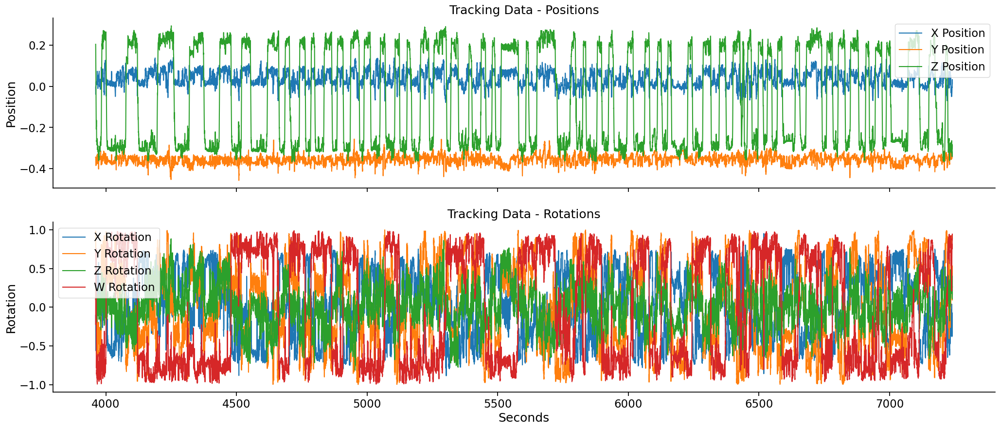

In [8]:
# Loadding in the TTLs
ttl_file = os.path.join(data_dir, 'preprocessing_output', f'supercat_{session_name}', f'{session_name}_tcat.obx0.obx.xd_8_12_0.txt')
ttls = np.loadtxt(ttl_file)
print(f"Number of TTLs: {len(ttls)}")

# Loadding in the tracking data
tracking_file = os.path.join(data_dir, "linear_maze_20250212.csv")
tracking_data = np.genfromtxt(tracking_file, delimiter=",", skip_header=7)
frames = tracking_data[:,0]
print(f'Number of frames: {len(frames)}')


# Sometimes there are a few more frames after the last TTL or more TTLs than frames. We will trim the data to the shortest length.
if len(frames) < len(ttls):
    print(f'Trimming TTLs from {len(ttls)} to {len(frames)}')
    ttls = ttls[:len(frames)]
    tracking_data = tracking_data[:len(frames),:]
elif len(frames) > len(ttls):
    print(f'Trimming frames from {len(frames)} to {len(ttls)}')
    frames = frames[:len(ttls)]
    tracking_data = tracking_data[:len(ttls),:]

# printing the start and end times
print(f'Tracking start time: {ttls[0]:.3f} s, end time: {ttls[-1]:.3f} s, duration: {ttls[-1]-ttls[0]:.3f} s')


# fill missing values or nan with linear interpolation
for i in range(tracking_data.shape[1]):
    col = tracking_data[:,i]
    nans = np.isnan(col)
    if np.any(nans):
        not_nans = ~nans
        interp_func_col = interp1d(frames[not_nans], col[not_nans], bounds_error=False, fill_value="extrapolate")
        col[nans] = interp_func_col(frames[nans])
        tracking_data[:,i] = col

# extract x, y, z positions and rotations
x_rotations = tracking_data[:,2]
y_rotations = tracking_data[:,3]
z_rotations = tracking_data[:,4]
w_rotations = tracking_data[:,5]
x_positions = tracking_data[:,6]
y_positions = tracking_data[:,7]
z_positions = tracking_data[:,8]

# Plotting the tracking data
fig, axs = plt.subplots(2, 1, figsize=(25,10), sharex=True)

sns.lineplot(ax=axs[0], x=ttls, y=x_positions, label='X Position')
sns.lineplot(ax=axs[0], x=ttls, y=y_positions, label='Y Position')
sns.lineplot(ax=axs[0], x=ttls, y=z_positions, label='Z Position')
axs[0].set_ylabel('Position')
axs[0].set_title('Tracking Data - Positions')

sns.lineplot(ax=axs[1], x=ttls, y=x_rotations, label='X Rotation')
sns.lineplot(ax=axs[1], x=ttls, y=y_rotations, label='Y Rotation')
sns.lineplot(ax=axs[1], x=ttls, y=z_rotations, label='Z Rotation')
sns.lineplot(ax=axs[1], x=ttls, y=w_rotations, label='W Rotation')
axs[1].set_xlabel('Seconds')
axs[1].set_ylabel('Rotation')
axs[1].set_title('Tracking Data - Rotations')
sns.despine()
plt.show()


In [9]:
# choose which position to use
pos_raw = z_positions  # original position samples aligned to `frames` (units: cm)
assert frames.shape[0] == pos_raw.shape[0]

# compute the speed
speed = np.abs(np.gradient(pos_raw)) / np.gradient(ttls)  # speed in m/s

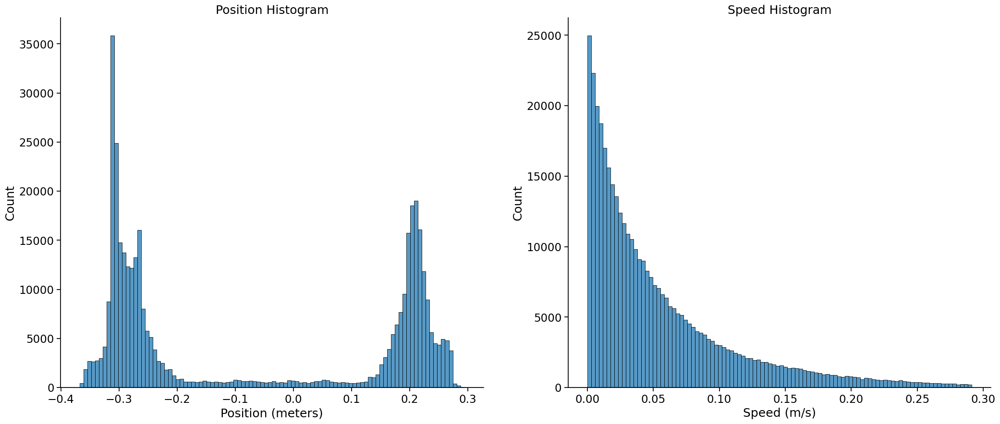

In [10]:
fig, axs = plt.subplots(1, 2, figsize=(25,10))
sns.histplot(ax=axs[0], x=pos_raw, bins=100)
axs[0].set_xlabel('Position (meters)')
axs[0].set_ylabel('Count')
axs[0].set_title('Position Histogram')

sns.histplot(ax=axs[1], x=speed[speed < np.percentile(speed, 99)], bins=100)
axs[1].set_xlabel('Speed (m/s)')
axs[1].set_ylabel('Count')
axs[1].set_title('Speed Histogram')
sns.despine()
plt.show()


Probe 0: spike_rate_matrix=(105, 246291), time_bins=(246291,), units=105
Position shape after interpolation: (246291,)
Probe 1: spike_rate_matrix=(307, 246291), time_bins=(246291,), units=307
Position shape after interpolation: (246291,)
Probe 2: spike_rate_matrix=(103, 246291), time_bins=(246291,), units=103
Position shape after interpolation: (246291,)


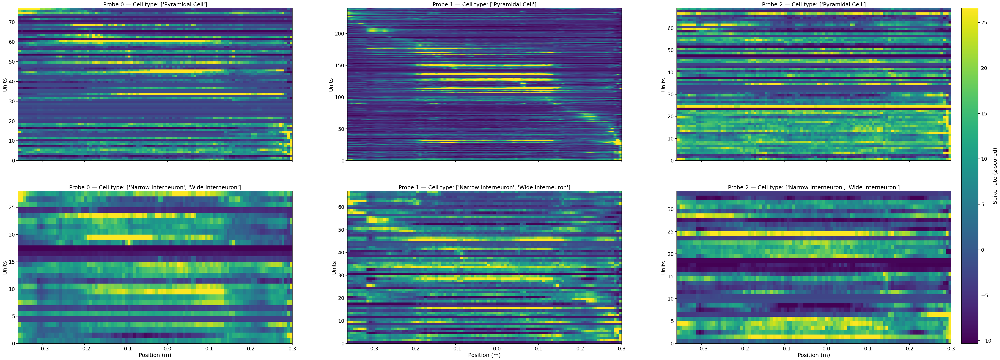

In [11]:
# -----------------------
# Config
# -----------------------
n_spatial_bins = 100
pos_min, pos_max = -0.36, 0.3
speed_threshold = 0.0  # m/s
cell_type_groups = {
    'Pyramidal':   ['Pyramidal Cell'],
    'Interneuron': ['Narrow Interneuron', 'Wide Interneuron'],
}
sort_by = 'peak'


# computing the spatial bin edges
bin_edges = np.linspace(pos_min, pos_max, n_spatial_bins + 1)

# Creating interpolation function for position
pos_interp_func = interp1d(ttls, pos_raw, kind = 'linear', bounds_error=False, fill_value=np.nan)

# All unique cell types across the selected probes
n_rows = max(1, len(cell_type_groups))
n_cols = max(1, len(probes))

fig, axs = plt.subplots(
    n_rows, n_cols,
    figsize=(20 * n_cols, 10 * n_rows),
    sharex=True,
    squeeze=False  # keep axs 2D even if rows/cols == 1
)

first_im = None  # first image we draw (for colorbar)
visible_axes = []  # collect visible axes for colorbar
all_place_fields = []  # dict[(probe, cell_type)] -> place field matrix

for i, probe in enumerate(probes):
    spike_rate_matrix, time_bins, units = spike_rate_matrices[probe]  # (n_units, n_timebins) time_bins are in seconds and represent the start of each bin
    ct_probe = np.asarray(cell_types[probe])                    # len == n_units
    print(f'Probe {probe}: spike_rate_matrix={spike_rate_matrix.shape}, time_bins={time_bins.shape}, units={len(units)}')


    # Interpolate position to the spike rate matrix time grid
    pos = pos_interp_func(time_bins)
    print(f'Position shape after interpolation: {pos.shape}')

    # Crop the spike rates to the TTL times
    valid_time = (time_bins >= np.min(ttls)) & (time_bins <= np.max(ttls))
    spike_rates = spike_rate_matrix[:, valid_time]
    time_bins = time_bins[valid_time]
    pos = pos[valid_time]


    # filtering based on speed
    speed = np.abs(np.gradient(pos, time_bins)) # speed in m/s
    move = speed > speed_threshold
    if move.sum() == 0:
        print(f"Probe {probe}: no samples exceed speed threshold ({speed_threshold} m/s).")
        for j in range(n_rows): axs[j, i].set_visible(False)
        continue

    # Apply speed mask
    spike_rates = spike_rates[:, move]
    pos = pos[move]
    time_bins = time_bins[move]

    # Map each timepoint to a spatial bin index
    idx = np.digitize(pos, bin_edges, right=True)  # 0..n_spatial_bins
    idx = np.clip(idx, 0, n_spatial_bins - 1)

    # Build dt aligned per sample: last sample inherits previous dt
    dt = np.empty_like(time_bins, dtype=float)
    dt[1:] = np.diff(time_bins)
    dt[0] = dt[1] if dt.size > 1 else 0.0
    dt = np.maximum(dt, 0.0)

    # Precompute occupancy once
    denom = np.bincount(idx, weights=dt, minlength=n_spatial_bins).astype(float)
    if denom.sum() == 0:
        print(f"Probe {probe}: zero occupancy across all bins.")
        for j in range(n_rows): axs[j, i].set_visible(False)
        continue

    # --- Per-cell-type loop (rows) ---
    for j, cell_type in enumerate(cell_type_groups):
        cell_type_label = cell_type_groups[cell_type]
        ax = axs[j, i]

        # unit indices for this cell type on this probe
        ct_indices = np.where(np.isin(ct_probe, cell_type_label))[0]
        if ct_indices.size == 0:
            ax.set_visible(False)
            continue

        # Build place fields for only those units
        place_fields = []
        for k in ct_indices:
            fr = spike_rates[k, :]
            num = np.bincount(idx, weights=fr, minlength=n_spatial_bins).astype(float)
            pf = np.divide(num, denom, out=np.zeros_like(num), where=(denom > 0))
            place_fields.append(pf)

        if len(place_fields) == 0:
            ax.set_visible(False)
            continue
        
        if sort_by == 'peak':
            # Sort by peak bin (within this cell type)
            pf_mat = np.vstack(place_fields)  # shape: (n_units_in_type, n_spatial_bins)
            order = np.argsort(np.argmax(pf_mat, axis=1))[::-1]  # earliest peak at top
            pf_mat = pf_mat[order, :]
        elif sort_by == 'corr':
            # Sort by correlation
            pf_mat = np.vstack(place_fields)  # shape: (n_units_in_type, n_spatial_bins)
            pf_mat = sort_units(pf_mat, mode='corr')

        # robust color scale per panel
        vmin = np.percentile(pf_mat, 2.5)
        vmax = np.percentile(pf_mat, 97.5)
        if vmin == vmax:  # edge case of constant activity
            vmax = vmin + 1e-9

        im = ax.imshow(
            pf_mat,
            aspect='auto',
            cmap='viridis',
            extent=[bin_edges[0], bin_edges[-1], 0, pf_mat.shape[0]],
            vmin=vmin, vmax=vmax,
            origin='lower'
        )

        if first_im is None:
            first_im = im
        visible_axes.append(ax)

        # Labels/titles
        if j == n_rows - 1:
            ax.set_xlabel('Position (m)')
        ax.set_ylabel('Units')
        ax.set_title(f'Probe {probe} — Cell type: {cell_type_label}')

        # Store place fields
        all_place_fields.append((probe, cell_type_label, np.array(pf_mat)))

# Colorbar across all visible panels
if first_im is not None and len(visible_axes) > 0:
    cbar = fig.colorbar(first_im, ax=visible_axes, orientation='vertical', fraction=0.07, pad=0.01)
    cbar.set_label('Spike rate (z-scored)')

plt.show()



In [ ]:
# plot all the place fields as lineplots and save to a directory
output_dir = os.path.join(data_dir, f'place_fields_lineplots_window_size_{WINDOW_SIZE}')
os.makedirs(output_dir, exist_ok=True)
for (probe, cell_type_label, pf_mat) in all_place_fields:
    n_units = pf_mat.shape[0]
    for unit_idx in range(n_units):
        pf = pf_mat[unit_idx, :]
        plt.figure(figsize=(15,8))
        sns.lineplot(x = 0.5 * (bin_edges[:-1] + bin_edges[1:]), y = pf, linewidth=4)
        plt.title(f'Probe {probe} — Cell type: {cell_type_label} — Unit {unit_idx}')
        plt.xlabel('Position (m)')
        plt.ylabel('Firing Rate (z-scored)')
        sns.despine()
        plot_file_path = os.path.join(output_dir, f'probe{probe}', f'celltype_{cell_type_label}')
        os.makedirs(plot_file_path, exist_ok=True)
        plot_filename = os.path.join(plot_file_path, f'unit{unit_idx}.png')
        plt.savefig(plot_filename)
        plt.close()
    

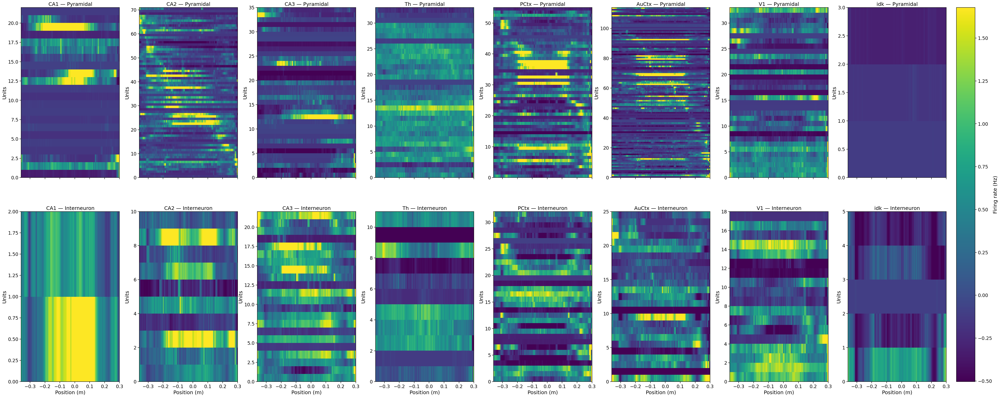

In [ ]:


# --- Choose regions to show as columns ---
regions_of_interest = ['CA1', 'CA2', 'CA3', 'Th', 'PCtx', 'AuCtx', 'V1', 'idk']   #

# Group the cell-metric labels into two families
cell_type_groups = {
    'Pyramidal':   ['Pyramidal Cell'],
    'Interneuron': ['Narrow Interneuron', 'Wide Interneuron'],
}




pos_interp_func = interp1d(ttls, pos_raw, bounds_error=False, fill_value=np.nan)

# -----------------------
# Precompute per-probe masks and occupancy
# -----------------------
probe_data = {}  # probe -> dict with masks, idx, denom, tb_m, pos_m, spike_rates_m
for probe in probes:
    spike_rate_matrix, tb, units = spike_rate_matrices[probe]  # (n_units, n_timebins)
    ct_probe = np.asarray(cell_types[probe])                    # len == n_units

    # Interpolate position to this probe’s time grid
    pos_probe = pos_interp_func(tb)

    # TTL crop
    start_time, end_time = np.min(ttls), np.max(ttls)
    valid_time = (tb >= start_time) & (tb <= end_time)

    fr = spike_rate_matrix[:, valid_time]
    tb_crop = tb[valid_time]
    pos_crop = pos_probe[valid_time]

    # Drop NaN position samples
    ok = ~np.isnan(pos_crop)
    if ok.sum() == 0:
        print(f"Probe {probe}: no valid samples after TTL/position masking.")
        probe_data[probe] = None
        continue

    fr = fr[:, ok]
    pos_crop = pos_crop[ok]
    tb_crop = tb_crop[ok]

    # Speed (smoothed) and moving-mask
    # gradient(pos, time) already gives velocity (m/s)
    speed = np.abs(np.gradient(pos_crop, tb_crop))
    speed = gaussian_filter1d(speed, sigma=3)

    move = speed > speed_threshold
    if move.sum() == 0:
        print(f"Probe {probe}: no samples exceed speed threshold ({speed_threshold} m/s).")
        probe_data[probe] = None
        continue

    # Apply moving mask
    fr_m   = fr[:, move]
    pos_m  = pos_crop[move]
    tb_m   = tb_crop[move]

    # Bin positions for this probe
    idx = np.digitize(pos_m, bin_edges, right=True)
    idx = np.clip(idx, 0, n_spatial_bins - 1)

    # Occupancy (counts per spatial bin) for this probe
    denom = np.bincount(idx, minlength=n_spatial_bins).astype(float)
    if denom.sum() == 0:
        print(f"Probe {probe}: zero occupancy across all bins.")
        probe_data[probe] = None
        continue

    probe_data[probe] = dict(
        fr_m=fr_m, tb_m=tb_m, pos_m=pos_m, idx=idx, denom=denom, ct=ct_probe
    )

# -----------------------
# Build per-(region, celltype) lists of place fields across probes
# -----------------------
panel_pfs = {}  # (row_key, col_key) -> list of 1D PF arrays
row_keys = ['Pyramidal', 'Interneuron']
col_keys = list(regions_of_interest)

# Helper to compute one unit's PF using its probe's occupancy
def unit_place_field(fr_unit, idx, denom):
    # weighted average rate per bin: sum(fr at timepoints in bin) / occupancy
    num = np.bincount(idx, weights=fr_unit, minlength=n_spatial_bins).astype(float)
    pf = np.divide(num, denom, out=np.zeros_like(num), where=(denom > 0))
    return pf

for rkey in row_keys:
    for ckey in col_keys:
        panel_pfs[(rkey, ckey)] = []

# We need unit-level region labels; `regions[probe]` already holds region per unit (after your earlier mask)
for probe in probes:
    pdata = probe_data.get(probe, None)
    if pdata is None:
        continue

    fr_m   = pdata['fr_m']       # (n_units_probe, n_timepoints_after_masks)
    idx    = pdata['idx']        # (n_timepoints_after_masks,)
    denom  = pdata['denom']      # (n_spatial_bins,)
    ct_arr = pdata['ct']         # (n_units_probe,)
    rgn_arr = regions[probe]     # (n_units_probe,) region name per unit

    for rkey in row_keys:
        allowed_ct = set(cell_type_groups[rkey])
        for ckey in col_keys:
            # Select units that are (this region, this cell-type)
            unit_sel = np.where((np.isin(ct_arr, list(allowed_ct))) & (rgn_arr == ckey))[0]
            if unit_sel.size == 0:
                continue

            # Compute PF per selected unit and append
            for u in unit_sel:
                pf = unit_place_field(fr_m[u, :], idx, denom)
                panel_pfs[(rkey, ckey)].append(pf)

# -----------------------
# Prepare matrices & global color scale
# -----------------------
panel_mats = {}  # (row_key, col_key) -> 2D array (n_units, n_bins) or None
all_vals = []

for rkey in row_keys:
    for ckey in col_keys:
        pf_list = panel_pfs[(rkey, ckey)]
        if len(pf_list) == 0:
            panel_mats[(rkey, ckey)] = None
            continue
        M = np.vstack(pf_list)  # (n_units_in_panel, n_spatial_bins)

        # Sort units by peak bin (descending so earlier peaks at top if you prefer)
        order = np.argsort(np.argmax(M, axis=1))[::-1]
        M = M[order, :]

        panel_mats[(rkey, ckey)] = M
        all_vals.append(M.ravel())

if len(all_vals) == 0:
    raise RuntimeError("No units found for the chosen regions/cell types after masking and binning.")

all_vals = np.concatenate(all_vals)
vmin = np.percentile(all_vals, 2.5)
vmax = np.percentile(all_vals, 97.5)
if vmin == vmax:
    vmax = vmin + 1e-12

# -----------------------
# Plot
# -----------------------
n_rows, n_cols = len(row_keys), len(col_keys)
fig, axs = plt.subplots(
    n_rows, n_cols,
    figsize=(8 * n_cols, 12 * n_rows),
    sharex=True,
    squeeze=False
)

first_im = None
visible_axes = []

for i, rkey in enumerate(row_keys):
    for j, ckey in enumerate(col_keys):
        ax = axs[i, j]
        M = panel_mats[(rkey, ckey)]
        if M is None or M.size == 0:
            ax.set_visible(False)
            continue

        im = ax.imshow(
            M,
            aspect='auto',
            cmap='viridis',
            extent=[bin_edges[0], bin_edges[-1], 0, M.shape[0]],
            vmin=vmin, vmax=vmax,
            origin='lower'
        )
        if first_im is None:
            first_im = im
        visible_axes.append(ax)

        title_txt = f"{ckey} — {rkey}"
        ax.set_title(title_txt)
        ax.set_ylabel("Units")
        if i == n_rows - 1:
            ax.set_xlabel("Position (m)")

# Shared colorbar
if first_im is not None and len(visible_axes) > 0:
    cbar = fig.colorbar(first_im, ax=visible_axes, orientation='vertical', fraction=0.07, pad=0.01)
    cbar.set_label("Firing rate")

plt.show()


In [ ]:
# save place fields line plots as above 
output_dir = os.path.join(data_dir, f'place_fields_lineplots_by_region_window_size_{WINDOW_SIZE}')
os.makedirs(output_dir, exist_ok=True)

for (rkey, ckey), M in panel_mats.items():
    if M is None or M.size == 0:
        continue
    n_units = M.shape[0]
    for unit_idx in range(n_units):
        pf = M[unit_idx, :]
        plt.figure(figsize=(15,8))
        sns.lineplot(x = 0.5 * (bin_edges[:-1] + bin_edges[1:]), y = pf, linewidth=4)
        plt.title(f'Region: {ckey} — Cell type: {rkey} — Unit {unit_idx}')
        plt.xlabel('Position (m)')
        plt.ylabel('Firing Rate (Hz)')
        sns.despine()
        plot_file_path = os.path.join(output_dir, f'region_{ckey}', f'celltype_{rkey}')
        os.makedirs(plot_file_path, exist_ok=True)
        plot_filename = os.path.join(plot_file_path, f'unit{unit_idx}.png')
        plt.savefig(plot_filename)
        plt.close()